In [46]:
import pandas as pd
import numpy as np

files = ["ap_2010.csv","class_size.csv","demographics.csv","graduation.csv","hs_directory.csv","math_test_results.csv","sat_results.csv"]

data={}

for f in files:
    d = pd.read_csv("/home/niraj/Downloads/schools/{0}".format(f))
    data[f.replace(".csv","")] = d
    

In [47]:
for k,v in data.items():
    print("\n"+ k+ "\n")
    print(v.head())


class_size

   CSD BOROUGH SCHOOL CODE                SCHOOL NAME GRADE  PROGRAM TYPE  \
0    1       M        M015  P.S. 015 Roberto Clemente     0K       GEN ED   
1    1       M        M015  P.S. 015 Roberto Clemente     0K          CTT   
2    1       M        M015  P.S. 015 Roberto Clemente     01       GEN ED   
3    1       M        M015  P.S. 015 Roberto Clemente     01          CTT   
4    1       M        M015  P.S. 015 Roberto Clemente     02       GEN ED   

  CORE SUBJECT (MS CORE and 9-12 ONLY) CORE COURSE (MS CORE and 9-12 ONLY)  \
0                                    -                                   -   
1                                    -                                   -   
2                                    -                                   -   
3                                    -                                   -   
4                                    -                                   -   

  SERVICE CATEGORY(K-9* ONLY)  NUMBER OF STUDENTS / SEA

In [48]:
data["demographics"]["DBN"].head()

0    01M015
1    01M015
2    01M015
3    01M015
4    01M015
Name: DBN, dtype: object

In [49]:
data["class_size"].head()

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN


In [50]:
data["hs_directory"]["DBN"]=data["hs_directory"]["dbn"]


In [51]:
data["class_size"]["DBN"]=data["class_size"].apply(lambda x :"{0:02d}{1}".format(x["CSD"],x["SCHOOL CODE"]),axis=1)

In [52]:
data["class_size"]["DBN"].head()

0    01M015
1    01M015
2    01M015
3    01M015
4    01M015
Name: DBN, dtype: object

In [53]:
survey1=pd.read_csv("/home/niraj/Downloads/schools/survey_all.txt",delimiter='\t',encoding='windows-1252')
survey2=pd.read_csv("/home/niraj/Downloads/schools/survey_d75.txt",delimiter='\t',encoding='windows-1252')
survey1["d75"]=False
survey2["d75"]=True
survey=pd.concat([survey1,survey2],axis=0)


In [54]:
survey.head()

,N_p,N_s,N_t,aca_p_11,aca_s_11,aca_t_11,aca_tot_11,bn,com_p_11,com_s_11,...,t_q8c_1,t_q8c_2,t_q8c_3,t_q8c_4,t_q9,t_q9_1,t_q9_2,t_q9_3,t_q9_4,t_q9_5
0,90.0,NaN,22.0,7.8,NaN,7.9,7.9,M015,7.6,NaN,...,29.0,67.0,5.0,0.0,NaN,5.0,14.0,52.0,24.0,5.0
1,161.0,NaN,34.0,7.8,NaN,9.1,8.4,M019,7.6,NaN,...,74.0,21.0,6.0,0.0,NaN,3.0,6.0,3.0,78.0,9.0
2,367.0,NaN,42.0,8.6,NaN,7.5,8.0,M020,8.3,NaN,...,33.0,35.0,20.0,13.0,NaN,3.0,5.0,16.0,70.0,5.0
3,151.0,145.0,29.0,8.5,7.4,7.8,7.9,M034,8.2,5.9,...,21.0,45.0,28.0,7.0,NaN,0.0,18.0,32.0,39.0,11.0
4,90.0,NaN,23.0,7.9,NaN,8.1,8.0,M063,7.9,NaN,...,59.0,36.0,5.0,0.0,NaN,10.0,5.0,10.0,60.0,15.0


In [55]:
survey["DBN"]=survey['dbn']
survey_fields = ["DBN", "rr_s", "rr_t", "rr_p", "N_s", "N_t", "N_p", "saf_p_11", "com_p_11", "eng_p_11", "aca_p_11", "saf_t_11", "com_t_11", "eng_t_10", "aca_t_11", "saf_s_11", "com_s_11", "eng_s_11", "aca_s_11", "saf_tot_11", "com_tot_11", "eng_tot_11", "aca_tot_11",]
survey=survey.loc[:,survey_fields]
data["survey"]=survey
survey.shape

(1702, 23)

In [56]:
data["class_size"].head()

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO,DBN
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN,01M015
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN,01M015
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN,01M015


In [57]:
data["sat_results"].head()

,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score
0,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,29,355,404,363
1,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,91,383,423,366
2,01M450,EAST SIDE COMMUNITY SCHOOL,70,377,402,370
3,01M458,FORSYTH SATELLITE ACADEMY,7,414,401,359
4,01M509,MARTA VALLE HIGH SCHOOL,44,390,433,384


In [58]:
class_size=data['class_size']
class_size=class_size[class_size['GRADE ']=="09-12"]
class_size=class_size[class_size['PROGRAM TYPE']=="GEN ED"]
class_size=class_size.groupby("DBN").agg(np.mean)
class_size.reset_index(inplace=True)
data['class_size']=class_size

In [59]:
data['demographics'].head()

,DBN,Name,schoolyear,fl_percent,frl_percent,total_enrollment,prek,k,grade1,grade2,...,black_num,black_per,hispanic_num,hispanic_per,white_num,white_per,male_num,male_per,female_num,female_per
0,01M015,P.S. 015 ROBERTO CLEMENTE,20052006,89.4,NaN,281,15,36,40,33,...,74,26.3,189,67.3,5,1.8,158.0,56.2,123.0,43.8
1,01M015,P.S. 015 ROBERTO CLEMENTE,20062007,89.4,NaN,243,15,29,39,38,...,68,28.0,153,63.0,4,1.6,140.0,57.6,103.0,42.4
2,01M015,P.S. 015 ROBERTO CLEMENTE,20072008,89.4,NaN,261,18,43,39,36,...,77,29.5,157,60.2,7,2.7,143.0,54.8,118.0,45.2
3,01M015,P.S. 015 ROBERTO CLEMENTE,20082009,89.4,NaN,252,17,37,44,32,...,75,29.8,149,59.1,7,2.8,149.0,59.1,103.0,40.9
4,01M015,P.S. 015 ROBERTO CLEMENTE,20092010,,96.5,208,16,40,28,32,...,67,32.2,118,56.7,6,2.9,124.0,59.6,84.0,40.4


In [60]:
demographics=data['demographics']
demographics=demographics[demographics["schoolyear"]==20112012]
data["demographics"]=demographics

In [61]:
data['math_test_results'].head()

,DBN,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %
0,01M015,3,2006,All Students,39,667,2,5.1%,11,28.2%,20,51.3%,6,15.4%,26,66.7%
1,01M015,3,2007,All Students,31,672,2,6.5%,3,9.7%,22,71%,4,12.9%,26,83.9%
2,01M015,3,2008,All Students,37,668,0,0%,6,16.2%,29,78.4%,2,5.4%,31,83.8%
3,01M015,3,2009,All Students,33,668,0,0%,4,12.1%,28,84.8%,1,3%,29,87.9%
4,01M015,3,2010,All Students,26,677,6,23.1%,12,46.2%,6,23.1%,2,7.7%,8,30.8%


In [63]:
math_test_results=data['math_test_results']
math_test_results=math_test_results[math_test_results['Year']==2011]
math_test_results=math_test_results[math_test_results['Grade']=='8']
data['math_test_results']=math_test_results

In [64]:
data['graduation'].head()

,Demographic,DBN,School Name,Cohort,Total Cohort,Total Grads - n,Total Grads - % of cohort,Total Regents - n,Total Regents - % of cohort,Total Regents - % of grads,...,Regents w/o Advanced - n,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - n,Local - % of cohort,Local - % of grads,Still Enrolled - n,Still Enrolled - % of cohort,Dropped Out - n,Dropped Out - % of cohort
0,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2003,5,s,s,s,s,s,...,s,s,s,s,s,s,s,s,s,s
1,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2004,55,37,67.3%,17,30.9%,45.9%,...,17,30.9%,45.9%,20,36.4%,54.1%,15,27.3%,3,5.5%
2,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2005,64,43,67.2%,27,42.2%,62.8%,...,27,42.2%,62.8%,16,25%,37.200000000000003%,9,14.1%,9,14.1%
3,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006,78,43,55.1%,36,46.2%,83.7%,...,36,46.2%,83.7%,7,9%,16.3%,16,20.5%,11,14.1%
4,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006 Aug,78,44,56.4%,37,47.4%,84.1%,...,37,47.4%,84.1%,7,9%,15.9%,15,19.2%,11,14.1%


In [65]:
graduation=data['graduation']
graduation=graduation[graduation['Demographic']=='Total Cohort']
graduation=graduation[graduation['Cohort']=="2006"]
data['graduation']=graduation

In [66]:
data['graduation'].head()

,Demographic,DBN,School Name,Cohort,Total Cohort,Total Grads - n,Total Grads - % of cohort,Total Regents - n,Total Regents - % of cohort,Total Regents - % of grads,...,Regents w/o Advanced - n,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - n,Local - % of cohort,Local - % of grads,Still Enrolled - n,Still Enrolled - % of cohort,Dropped Out - n,Dropped Out - % of cohort
3,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006,78,43,55.1%,36,46.2%,83.7%,...,36,46.2%,83.7%,7,9%,16.3%,16,20.5%,11,14.1%
10,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2006,124,53,42.7%,42,33.9%,79.2%,...,34,27.4%,64.2%,11,8.9%,20.8%,46,37.1%,20,16.100000000000001%
17,Total Cohort,01M450,EAST SIDE COMMUNITY SCHOOL,2006,90,70,77.8%,67,74.400000000000006%,95.7%,...,67,74.400000000000006%,95.7%,3,3.3%,4.3%,15,16.7%,5,5.6%
24,Total Cohort,01M509,MARTA VALLE HIGH SCHOOL,2006,84,47,56%,40,47.6%,85.1%,...,23,27.4%,48.9%,7,8.300000000000001%,14.9%,25,29.8%,5,6%
31,Total Cohort,01M515,LOWER EAST SIDE PREPARATORY HIGH SCHO,2006,193,105,54.4%,91,47.2%,86.7%,...,22,11.4%,21%,14,7.3%,13.3%,53,27.5%,35,18.100000000000001%


In [67]:
cols = ['SAT Math Avg. Score', 'SAT Critical Reading Avg. Score', 'SAT Writing Avg. Score']

for c in cols:
    data['sat_results'][c]=data['sat_results'][c].convert_objects(convert_numeric=True)

data['sat_results']['sat_score']=data['sat_results'][cols[0]]+data['sat_results'][cols[1]]+data['sat_results'][cols[2]]    

/home/niraj/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:4: FutureWarning: convert_objects is deprecated.  Use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


In [68]:
data["hs_directory"].head()

,dbn,school_name,boro,building_code,phone_number,fax_number,grade_span_min,grade_span_max,expgrade_span_min,expgrade_span_max,...,priority03,priority04,priority05,priority06,priority07,priority08,priority09,priority10,Location 1,DBN
0,17K548,Brooklyn School for Music & Theatre,Brooklyn,K440,718-230-6250,718-230-6262,9,12,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"883 Classon Avenue\nBrooklyn, NY 11225\n(40.67...",17K548
1,09X543,High School for Violin and Dance,Bronx,X400,718-842-0687,718-589-9849,9,12,NaN,NaN,...,Then to Bronx students or residents,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,"1110 Boston Road\nBronx, NY 10456\n(40.8276026...",09X543
2,09X327,Comprehensive Model School Project M.S. 327,Bronx,X240,718-294-8111,718-294-8109,6,12,NaN,NaN,...,Then to New York City residents who attend an ...,Then to Bronx students or residents,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,"1501 Jerome Avenue\nBronx, NY 10452\n(40.84241...",09X327
3,02M280,Manhattan Early College School for Advertising,Manhattan,M520,718-935-3477,NaN,9,10,9,14.0,...,Then to Manhattan students or residents,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,"411 Pearl Street\nNew York, NY 10038\n(40.7106...",02M280
4,28Q680,Queens Gateway to Health Sciences Secondary Sc...,Queens,Q695,718-969-3155,718-969-3552,6,12,NaN,NaN,...,Then to Queens students or residents,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,"160-20 Goethals Avenue\nJamaica, NY 11432\n(40...",28Q680


In [69]:
data["hs_directory"]["Location 1"]

0      883 Classon Avenue\nBrooklyn, NY 11225\n(40.67...
1      1110 Boston Road\nBronx, NY 10456\n(40.8276026...
2      1501 Jerome Avenue\nBronx, NY 10452\n(40.84241...
3      411 Pearl Street\nNew York, NY 10038\n(40.7106...
4      160-20 Goethals Avenue\nJamaica, NY 11432\n(40...
5      3000 East Tremont Avenue\nBronx, NY 10461\n(40...
6      850 Grand Street\nBrooklyn, NY 11211\n(40.7119...
7      345 East 15Th Street\nNew York, NY 10003\n(40....
8      167-01 Gothic Drive\nJamaica, NY 11432\n(40.71...
9      207-01 116th Avenue\nCambria Heights, NY 11411...
10     1716 Southern Boulevard\nBronx, NY 10460\n(40....
11     411 Pearl Street\nNew York, NY 10038\n(40.7106...
12     650 Academy Street\nNew York, NY 10002\n(40.86...
13     37-02 47 Avenue\nLong Island City, NY 11101\n(...
14     2975 Tibbett Avenue\nBronx, NY 10463\n(40.8800...
15     511 West 182Nd Street\nNew York, NY 10033\n(40...
16     5800 Tilden Avenue\nBrooklyn, NY 11203\n(40.64...
17     122 Amsterdam Avenue\nNe

In [70]:
data["hs_directory"]["lat"]=data["hs_directory"]["Location 1"].apply(lambda x : x.split("\n")[-1].replace("(","").replace(")","").split(", ")[0])

In [71]:
data["hs_directory"]["lon"]=data["hs_directory"]["Location 1"].apply(lambda x : x.split("\n")[-1].replace("(","").replace(")","").split(", ")[1])

In [72]:
data["hs_directory"]["lat"]=pd.to_numeric(data["hs_directory"]["lat"])

In [73]:
data["hs_directory"]["lon"]=pd.to_numeric(data["hs_directory"]["lon"])

In [74]:
for k,v in data.items():
    print(k)
    print(v.head())

class_size
      DBN  CSD  NUMBER OF STUDENTS / SEATS FILLED  NUMBER OF SECTIONS  \
0  01M292    1                            88.0000            4.000000   
1  01M332    1                            46.0000            2.000000   
2  01M378    1                            33.0000            1.000000   
3  01M448    1                           105.6875            4.750000   
4  01M450    1                            57.6000            2.733333   

   AVERAGE CLASS SIZE  SIZE OF SMALLEST CLASS  SIZE OF LARGEST CLASS  \
0           22.564286                   18.50              26.571429   
1           22.000000                   21.00              23.500000   
2           33.000000                   33.00              33.000000   
3           22.231250                   18.25              27.062500   
4           21.200000                   19.40              22.866667   

   SCHOOLWIDE PUPIL-TEACHER RATIO  
0                             NaN  
1                             NaN  
2        

In [75]:
flat_data_names =[k for k,v in data.items()]

In [76]:
flat_data_names

['class_size',
 'demographics',
 'math_test_results',
 'ap_2010',
 'survey',
 'graduation',
 'hs_directory',
 'sat_results']

In [77]:
flat_data=[data[k] for k,v in data.items()]

In [78]:
flat_data

[        DBN  CSD  NUMBER OF STUDENTS / SEATS FILLED  NUMBER OF SECTIONS  \
 0    01M292    1                          88.000000            4.000000   
 1    01M332    1                          46.000000            2.000000   
 2    01M378    1                          33.000000            1.000000   
 3    01M448    1                         105.687500            4.750000   
 4    01M450    1                          57.600000            2.733333   
 5    01M458    1                          28.600000            1.200000   
 6    01M509    1                          69.642857            3.000000   
 7    01M515    1                         131.117647            5.529412   
 8    01M539    1                         156.368421            6.157895   
 9    01M650    1                          64.125000            2.937500   
 10   01M696    1                         214.166667           10.250000   
 11   02M047    2                          26.818182            1.636364   
 12   02M104

In [79]:
full = flat_data[0]

In [80]:
full

,DBN,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,SCHOOLWIDE PUPIL-TEACHER RATIO
0,01M292,1,88.000000,4.000000,22.564286,18.500000,26.571429,NaN
1,01M332,1,46.000000,2.000000,22.000000,21.000000,23.500000,NaN
2,01M378,1,33.000000,1.000000,33.000000,33.000000,33.000000,NaN
3,01M448,1,105.687500,4.750000,22.231250,18.250000,27.062500,NaN
4,01M450,1,57.600000,2.733333,21.200000,19.400000,22.866667,NaN
5,01M458,1,28.600000,1.200000,23.000000,22.600000,23.400000,NaN
6,01M509,1,69.642857,3.000000,23.571429,20.000000,27.357143,NaN
7,01M515,1,131.117647,5.529412,22.876471,15.764706,28.588235,NaN
8,01M539,1,156.368421,6.157895,25.510526,19.473684,31.210526,NaN
9,01M650,1,64.125000,2.937500,21.781250,18.687500,24.750000,NaN


In [81]:
for i,f in enumerate(flat_data[1:]):
    name = flat_data_names[i+1]
    print(name)
    print(len(f["DBN"]) - len(f["DBN"].unique()))
    join_type="inner"
    if name in ["sat_results","ap_2010","graduation"]:
        join_type="outer"
    if name not in ["math_test_results"]:
        full = full.merge(f,on="DBN",how=join_type)
        
full.shape

demographics
0
math_test_results
0
ap_2010
1
survey
0
graduation
0
hs_directory
0
sat_results
0


(489, 159)

In [85]:
cols = ['AP Test Takers ', 'Total Exams Taken', 'Number of Exams with scores 3 4 or 5']

for col in cols:
    full[col] = full[col].convert_objects(convert_numeric=True)

full[cols] = full[cols].fillna(value=0)    

/home/niraj/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:5: FutureWarning: convert_objects is deprecated.  Use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


In [86]:
full['school_dist']=full['DBN'].apply(lambda x:x[:2])

In [87]:
full=full.fillna(full.mean())

In [90]:
full.shape

(489, 160)

In [123]:
full['school_dist']

0      01
1      01
2      01
3      01
4      01
5      01
6      02
7      02
8      02
9      02
10     02
11     02
12     02
13     02
14     02
15     02
16     02
17     02
18     02
19     02
20     02
21     02
22     02
23     02
24     02
25     02
26     02
27     02
28     02
29     02
       ..
459    21
460    21
461    22
462    23
463    23
464    23
465    24
466    24
467    25
468    25
469    25
470    27
471    28
472    28
473    28
474    29
475    29
476    31
477    31
478    32
479    75
480    75
481    75
482    75
483    75
484    75
485    75
486    79
487    79
488    79
Name: school_dist, dtype: object

In [107]:
full.corr()['sat_score']

CSD                                     0.042079
NUMBER OF STUDENTS / SEATS FILLED       0.371835
NUMBER OF SECTIONS                      0.340073
AVERAGE CLASS SIZE                      0.355930
SIZE OF SMALLEST CLASS                  0.227560
SIZE OF LARGEST CLASS                   0.295206
SCHOOLWIDE PUPIL-TEACHER RATIO               NaN
schoolyear                                   NaN
frl_percent                            -0.666264
total_enrollment                        0.351219
ell_num                                -0.142884
ell_percent                            -0.378157
sped_num                                0.036469
sped_percent                           -0.418452
asian_num                               0.452127
asian_per                               0.538402
black_num                               0.031019
black_per                              -0.266331
hispanic_num                            0.027666
hispanic_per                           -0.373252
white_num           

In [108]:
import folium
from folium import plugins

In [111]:
schools_map=folium.Map(location=[full['lat'].mean(),full['lon'].mean()],zoom_start=10)
marker_cluster=folium.MarkerCluster().add_to(schools_map)
for name,row in full.iterrows():
    folium.Marker([row["lat"],row["lon"]],popup="{0}: {1}".format(row["DBN"],row["school_name"])).add_to(marker_cluster)
schools_map.save('schools.html')    

In [110]:
schools_map

In [112]:
schools_heatmap = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
schools_heatmap.add_children(plugins.HeatMap([[row["lat"], row["lon"]] for name, row in full.iterrows()]))
schools_heatmap.save("heatmap.html")


In [113]:
schools_heatmap

In [117]:
district_data=full.groupby('school_dist').agg(np.mean)

In [118]:
district_data.reset_index(inplace=True)

In [119]:
district_data['school_dist']=district_data['school_dist'].apply(lambda x : str(int(x)))

In [124]:
def show_district_map(col):
    geo_path='/home/niraj/Downloads/schools/SchoolDistricts.geojson'
    districts=folium.Map(location=[full['lat'].mean(),full['lon'].mean()],zoom_start=10)
    districts.choropleth(
        geo_path=geo_path,
        data=district_data,
        columns=['school_dist',col],
        key_on='feature.properties.school_dist',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2
    )
    districts.save("districts.html")
    return districts

show_district_map("sat_score")

/home/niraj/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: FutureWarning: 'threshold_scale' default behavior has changed. Now you get a linear scale between the 'min' and the 'max' of your data. To get former behavior, use folium.utilities.split_six.


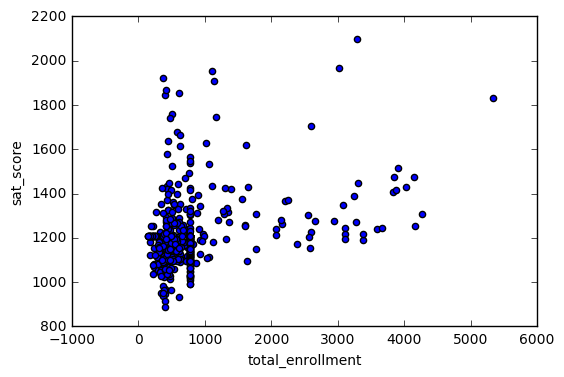

In [125]:
%matplotlib inline

full.plot.scatter(x='total_enrollment',y='sat_score')

In [128]:
full[(full["total_enrollment"] < 1000) & (full["sat_score"] < 1000)]["School Name"]

95       INTERNATIONAL COMMUNITY HIGH SCHOOL
130                                      NaN
131          BRONX INTERNATIONAL HIGH SCHOOL
144    KINGSBRIDGE INTERNATIONAL HIGH SCHOOL
146    INTERNATIONAL SCHOOL FOR LIBERAL ARTS
183                                      NaN
186            HIGH SCHOOL OF WORLD CULTURES
195       BROOKLYN INTERNATIONAL HIGH SCHOOL
233    INTERNATIONAL HIGH SCHOOL AT PROSPECT
245               IT TAKES A VILLAGE ACADEMY
261                MULTICULTURAL HIGH SCHOOL
294    PAN AMERICAN INTERNATIONAL HIGH SCHOO
443                                      NaN
463                                      NaN
Name: School Name, dtype: object

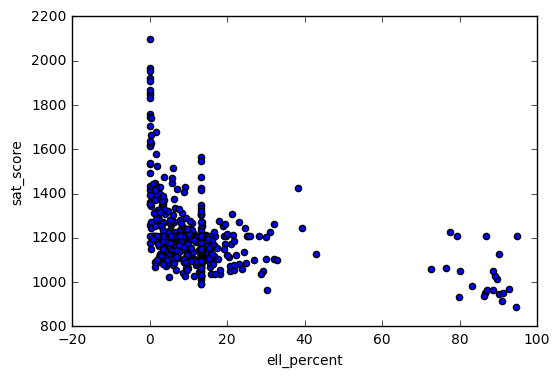

In [129]:
full.plot.scatter(x="ell_percent",y="sat_score")

In [130]:
show_district_map("ell_percent")

/home/niraj/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: FutureWarning: 'threshold_scale' default behavior has changed. Now you get a linear scale between the 'min' and the 'max' of your data. To get former behavior, use folium.utilities.split_six.


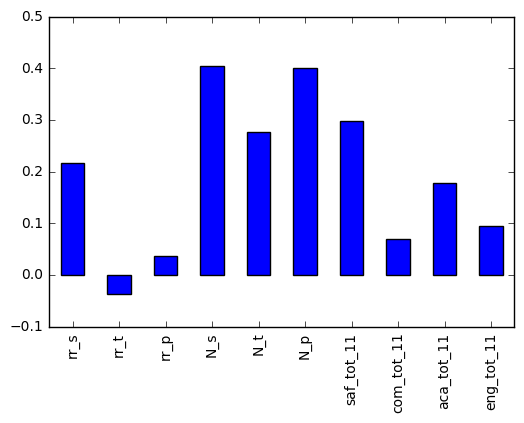

In [131]:
full.corr()["sat_score"][["rr_s", "rr_t", "rr_p", "N_s", "N_t", "N_p", "saf_tot_11", "com_tot_11", "aca_tot_11", "eng_tot_11"]].plot.bar()


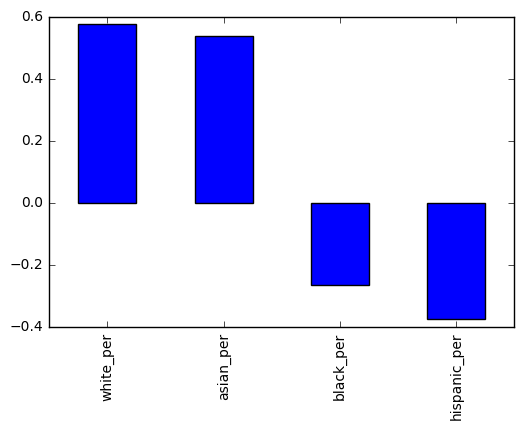

In [132]:
full.corr()["sat_score"][["white_per", "asian_per", "black_per", "hispanic_per"]].plot.bar()


In [133]:
show_district_map("hispanic_per")

/home/niraj/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: FutureWarning: 'threshold_scale' default behavior has changed. Now you get a linear scale between the 'min' and the 'max' of your data. To get former behavior, use folium.utilities.split_six.


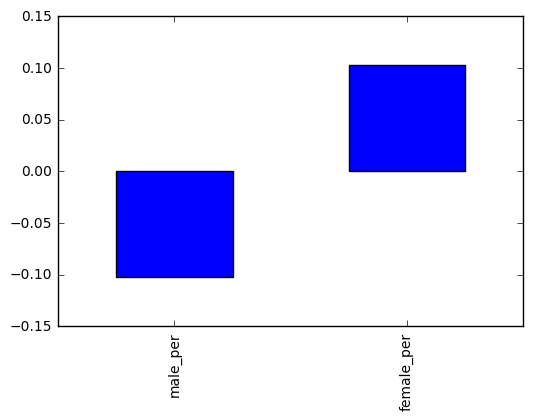

In [134]:

full.corr()["sat_score"][["male_per", "female_per"]].plot.bar()

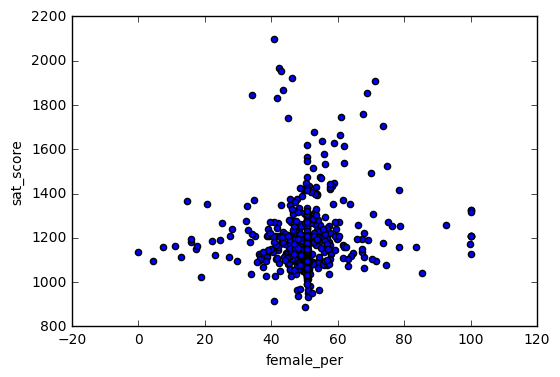

In [135]:
full.plot.scatter(x='female_per',y='sat_score')

In [138]:
full[(full['female_per']>65) & (full['sat_score']>1400)]['School Name']

5                    BARD HIGH SCHOOL EARLY COLLEGE
22            PROFESSIONAL PERFORMING ARTS HIGH SCH
26                    ELEANOR ROOSEVELT HIGH SCHOOL
41                     TALENT UNLIMITED HIGH SCHOOL
62             FIORELLO H. LAGUARDIA HIGH SCHOOL OF
310                     TOWNSEND HARRIS HIGH SCHOOL
352    FRANK SINATRA SCHOOL OF THE ARTS HIGH SCHOOL
Name: School Name, dtype: object

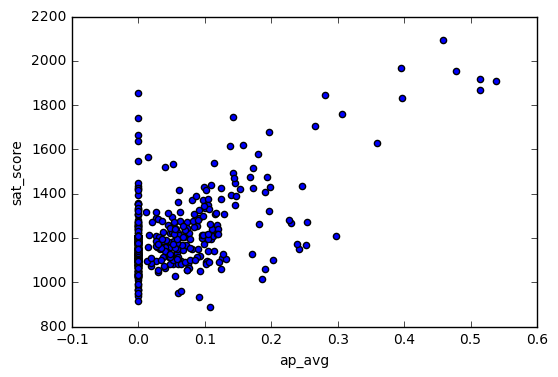

In [140]:
full["ap_avg"]=full["AP Test Takers "]/full["total_enrollment"]
full.plot.scatter(x="ap_avg",y="sat_score")

In [141]:
full[(full["ap_avg"] > .3) & (full["sat_score"] > 1700)]["School Name"]

26             ELEANOR ROOSEVELT HIGH SCHOOL
38                    STUYVESANT HIGH SCHOOL
156             BRONX HIGH SCHOOL OF SCIENCE
160    HIGH SCHOOL OF AMERICAN STUDIES AT LE
194           BROOKLYN TECHNICAL HIGH SCHOOL
310              TOWNSEND HARRIS HIGH SCHOOL
337    QUEENS HIGH SCHOOL FOR THE SCIENCES A
366      STATEN ISLAND TECHNICAL HIGH SCHOOL
Name: School Name, dtype: object